# **CUSTOM OBJECT DETECTION API WITH TENSORFLOW 2**

Credits to:

1. This notebook was inspired by Youtube Tutorial video by *Krish Naik* and can be refered using this [LINK](https://www.youtube.com/watch?v=XoMiveY_1Z4&ab_channel=KrishNaik).
2. This notebook was inspired by a ansonn07 GitHub and can be refered using this [LINK](https://github.com/ansonnn07/object-detection).

### **STEP 1: Check Tensorflow version & GPU availability**

In [1]:
# Check tensorflow version
import tensorflow as tf
print(tf.__version__)

2.8.0


In [2]:
#check whether tensorflow has acess to GPU
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

### **STEP 2: Install TFOD 2.0 to the Virtual Environment**

Installation of Tensorflow 2 Object Detection API can be refered in this [LINK](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/install.html)

To execute everytime run in Google Colab. If run locally only install only once.

##### **STEP 2.1: Git Clone Tensorflow GitHub**

In [3]:
# clone Tensorflow github
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 72885, done.
remote: Counting objects: 100% (60/60), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 72885 (delta 29), reused 29 (delta 13), pack-reused 72825
Receiving objects: 100% (72885/72885), 579.29 MiB | 38.94 MiB/s, done.
Resolving deltas: 100% (51598/51598), done.


#### **STEP 2.2: Install Protobuf**

*   command to check the current path



In [4]:
pwd

'/content'

*   command to change directory to the particular folder



In [5]:
cd /content/models/research

/content/models/research


In [6]:
# From within TensorFlow/models/research/
!protoc object_detection/protos/*.proto --python_out=.

#### **STEP 2.3: Install COCO-API**

In [7]:
# Use Linux command for Google Colab
!git clone https://github.com/cocodataset/cocoapi.git

Cloning into 'cocoapi'...
remote: Enumerating objects: 975, done.
remote: Total 975 (delta 0), reused 0 (delta 0), pack-reused 975
Receiving objects: 100% (975/975), 11.72 MiB | 24.96 MiB/s, done.
Resolving deltas: 100% (576/576), done.


In [8]:
cd cocoapi/PythonAPI

/content/models/research/cocoapi/PythonAPI


In [9]:
!make

python setup.py build_ext --inplace
running build_ext
cythoning pycocotools/_mask.pyx to pycocotools/_mask.c
/usr/local/lib/python3.7/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/models/research/cocoapi/PythonAPI/pycocotools/_mask.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/pycocotools
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/local/lib/python3.7/dist-packages/numpy/core/include -I../common -I/usr/include/python3.7m -c ../common/maskApi.c -o build/temp.linux-x86_64-3.7

In [10]:
cp -r pycocotools /content/models/research

#### **STEP 2.4: Install Object Detection API**

In [11]:
pwd

'/content/models/research/cocoapi/PythonAPI'

In [12]:
cd .. 

/content/models/research/cocoapi


In [13]:
cd .. 

/content/models/research


In [14]:
cp object_detection/packages/tf2/setup.py .

In [15]:
!python -m pip install .

Processing /content/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 10.2 MB 8.2 MB/s 
     |████████████████████████████████| 352 kB 73.2 MB/s 
     |████████████████████████████████| 2.2 MB 58.4 MB/s 
     |████████████████████████████████| 23.4 MB 1.5 MB/s 
     |████████████████████████████████| 1.1 MB 58.4 MB/s 
     |████████████████████████████████| 47.8 MB 1.2 MB/s 
     |████████████████████████████████| 4.9 MB 53.3 MB/s 
     |████████████████████████████████| 99 kB 10.8 MB/s 
     |████████████████████████████████| 636 kB 56.3 MB/s 
     |████████████████████████████████| 90 kB 1

#### **STEP 2.5: Test the Installation**

In [16]:
pwd

'/content/models/research'

In [17]:
# From within TensorFlow/models/research/
!python object_detection/builders/model_builder_tf2_test.py

Running tests under Python 3.7.13: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2022-05-14 03:11:21.561084: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0514 03:11:21.804217 139717793077120 model_builder.py:1102] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 4.74s
I0514 03:11:22.166562 139717793077120 test_util.py:2374] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 4.74s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.49s
I0514 03:11:22.655830 139717793077120 test

### **STEP 3: Create Folder paths and Important Files to the current working space**
#### **create folders exactly as in example below**

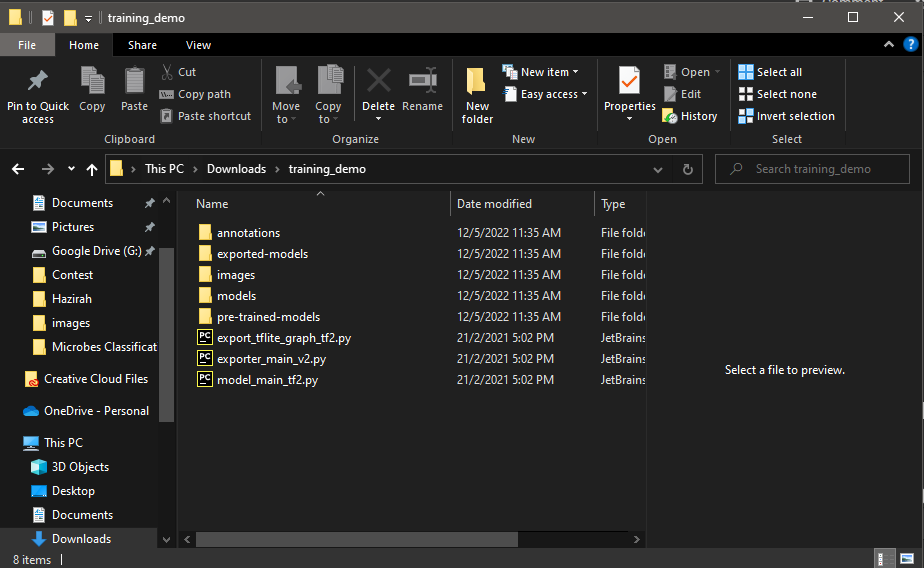

In [18]:
# Install opencv-python-headless==4.5.2.52 (https://stackoverflow.com/questions/70537488/cannot-import-name-registermattype-from-cv2-cv2)
!pip install opencv-python-headless==4.5.2.52
!pip install wget

     |████████████████████████████████| 38.2 MB 1.3 MB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.5.5.64
    Uninstalling opencv-python-headless-4.5.5.64:
      Successfully uninstalled opencv-python-headless-4.5.5.64
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=9f9765900f7f6297719d3bd68e05b16ef47dee2dd6271880b0a41639af170174
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [19]:
import os
import cv2
import time
# shutil is used to move files
import shutil
from imutils import paths

In [20]:
PRETRAINED_MODEL_URL = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8.tar.gz'
PRETRAINED_MODEL_NAME = PRETRAINED_MODEL_URL.split("/")[-1].split(".tar.gz")[0]
CUSTOM_MODEL_NAME = 'my_model'
LABEL_MAP_NAME = 'label_map.pbtxt'

In [21]:
# create root path where to store all the important files
root_path = "/content/training_demo"
api_model_path = "/content/models"

In [22]:
# Create a dictionary for all the paths that we're going to use
paths = {
    'ROOT_PATH': root_path,
    'API_MODEL_PATH': api_model_path,
    'ANNOTATION_PATH': os.path.join(root_path, 'annotations'),
    'IMAGE_PATH': os.path.join(root_path, 'images'),
    'MODEL_PATH': os.path.join(root_path, 'models'),
    'PRETRAINED_MODEL_PATH': os.path.join(root_path, 'pre-trained-models'),
    'CHECKPOINT_PATH': os.path.join(root_path, 'models', CUSTOM_MODEL_NAME),
    'OUTPUT_PATH': os.path.join(root_path,'exported-models', 'custom_trained_model'),
}

In [23]:
#Create all the necessary paths from the dictionary that don't exist yet
for path in paths.values():
    if not os.path.exists(path):
        os.makedirs(path)

In [24]:
# Creating train and test folder in images folder
train_dir = os.path.join(paths['IMAGE_PATH'],'train')
test_dir = os.path.join(paths['IMAGE_PATH'], 'test')

if not os.path.exists(train_dir):
  os.makedirs(train_dir)

if not os.path.exists(test_dir):
  os.makedirs(test_dir)


In [25]:
files = {
    'MY_MODEL': os.path.join(paths['MODEL_PATH'], CUSTOM_MODEL_NAME),
    'PIPELINE_CONFIG': os.path.join(paths['CHECKPOINT_PATH'], 'pipeline.config'),
    'GENETRATE_TF_RECORD': os.path.join(root_path, 'utils', 'generate_tfrecord.py'),
    'LABELMAP': os.path.join(paths['ANNOTATION_PATH'], LABEL_MAP_NAME)
    }

### **STEP 4: Import Images data and generate_tfrecord.py from Google Drive**

In [26]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


or you can directly...

1.   Copy all generate_tfrecord.py file into root folder
2.   Copy all the images into its respective folder



In [27]:
# copy train and test folder to images folder
!cp -av '/content/drive/MyDrive/Custom-TFOD-2.0/images/train' '/content/training_demo/images'
!cp -av '/content/drive/MyDrive/Custom-TFOD-2.0/images/test' '/content/training_demo/images'
# copy generate_tfrecord file to root folder
!cp -av '/content/drive/MyDrive/Custom-TFOD-2.0/generate_tfrecord.py' '/content/training_demo'

'/content/drive/MyDrive/Custom-TFOD-2.0/images/train/image1.jpg' -> '/content/training_demo/images/train/image1.jpg'
'/content/drive/MyDrive/Custom-TFOD-2.0/images/train/image9.jpg' -> '/content/training_demo/images/train/image9.jpg'
'/content/drive/MyDrive/Custom-TFOD-2.0/images/train/image3.jpg' -> '/content/training_demo/images/train/image3.jpg'
'/content/drive/MyDrive/Custom-TFOD-2.0/images/train/image16.jpg' -> '/content/training_demo/images/train/image16.jpg'
'/content/drive/MyDrive/Custom-TFOD-2.0/images/train/image18.jpg' -> '/content/training_demo/images/train/image18.jpg'
'/content/drive/MyDrive/Custom-TFOD-2.0/images/train/image17.jpg' -> '/content/training_demo/images/train/image17.jpg'
'/content/drive/MyDrive/Custom-TFOD-2.0/images/train/image3.xml' -> '/content/training_demo/images/train/image3.xml'
'/content/drive/MyDrive/Custom-TFOD-2.0/images/train/image9.xml' -> '/content/training_demo/images/train/image9.xml'
'/content/drive/MyDrive/Custom-TFOD-2.0/images/train/image

### **STEP 5: Download Pre-trained-model from model zoo**

[Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md)

In [28]:
pwd

'/content/models/research'


*   command reverse cd command



In [29]:
cd .. 

/content/models


In [30]:
cd .. 

/content


In [31]:
cd /content/training_demo/pre-trained-models

/content/training_demo/pre-trained-models


In [32]:
# download selected pre-trained model from MODEL ZOO into the pre-trained-models folder
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8.tar.gz

--2022-05-14 03:12:32--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.132.128, 2607:f8b0:4001:c00::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.132.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 386527459 (369M) [application/x-tar]
Saving to: ‘ssd_resnet101_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet101_v1_fp 100%[===================>] 368.62M   234MB/s    in 1.6s    

2022-05-14 03:12:34 (234 MB/s) - ‘ssd_resnet101_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [386527459/386527459]



In [33]:
# extract the downloaded pre-trained-model using this command
!tar -xvf ssd_resnet101_v1_fpn_640x640_coco17_tpu-8.tar.gz

ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/checkpoint/
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/checkpoint/checkpoint
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/checkpoint/ckpt-0.index
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/pipeline.config
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/saved_model/
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/saved_model/saved_model.pb
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/saved_model/assets/
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/saved_model/variables/
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/saved_model/variables/variables.index


### **STEP 6: Create Label Map & generate_tfrecord to the working space folder**

##### **STEP 6.1: Create Label Map**

In [34]:
# Create label map file
CLASS_NAMES = ['car', 'bike'] #change accordingly to the specific task

with open(files['LABELMAP'],'w') as f:
    for idx, label in enumerate(CLASS_NAMES,start=1):
        f.write("item { \n")
        f.write(f"\tname: '{label}'\n")
        f.write(f"\tid: {idx}\n")
        f.write("}\n")

#Double check the written file
print(files['LABELMAP'])
with open(files['LABELMAP']) as f:
    print(f.read())

/content/training_demo/annotations/label_map.pbtxt
item { 
	name: 'car'
	id: 1
}
item { 
	name: 'bike'
	id: 2
}



#### **STEP 6.2: Create TF record**


1.   Copy the generate_tfrecord.py into root_folder
*Notes: .py files can be downloaded via [LINK](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html)*


In [35]:
pwd

'/content/training_demo/pre-trained-models'

In [36]:
cd /content/training_demo

/content/training_demo


In [37]:
# Create train data:
!python generate_tfrecord.py -x /content/training_demo/images/train -l /content/training_demo/annotations/label_map.pbtxt -o /content/training_demo/annotations/train.record

# Create test data:
!python generate_tfrecord.py -x /content/training_demo/images/test -l /content/training_demo/annotations/label_map.pbtxt -o /content/training_demo/annotations/test.record

Successfully created the TFRecord file: /content/training_demo/annotations/train.record
Successfully created the TFRecord file: /content/training_demo/annotations/test.record


### **STEP 7: Update pipeline_config.py**

In [38]:
# Copy pipeline config to our my_model folder
original_config = "/content/training_demo/pre-trained-models/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/pipeline.config"
print(original_config)

shutil.copy2(original_config, files['MY_MODEL'])

"""
Note: pipeline.config will be created in where paths['MY_MODEL'] points to,
which is pointed by files['PIPELINE_CONFIG']
"""

/content/training_demo/pre-trained-models/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/pipeline.config


"\nNote: pipeline.config will be created in where paths['MY_MODEL'] points to,\nwhich is pointed by files['PIPELINE_CONFIG']\n"

In [39]:
PRETRAINED_MODEL_NAME = "/content/training_demo/pre-trained-models/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8"

In [40]:
#Apply transfer learning
#Hyperparameters and options to change

number_of_classes = len(CLASS_NAMES)
batch_size = 8
total_steps = 2000
fine_tune_checkpoint = os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME ,'checkpoint','ckpt-0')
fine_tune_checkpoint_type = "detection"
label_map_path = files['LABELMAP']
train_tfrecord = os.path.join(paths['ANNOTATION_PATH'],'train.record')
test_tfrecord = os.path.join(paths['ANNOTATION_PATH'],'test.record')

In [41]:
from object_detection.utils import config_util
from object_detection.protos import pipeline_pb2
from google.protobuf import text_format

#Your pipeline config file is here
print(files['PIPELINE_CONFIG'])
#Check the config file
config = config_util.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])
print(type(config['model']))

/content/training_demo/models/my_model/pipeline.config
<class 'object_detection.protos.model_pb2.DetectionModel'>


In [42]:
# Update pipeline_config in teh my_model folder

#(a) Change the number of classes
config_util._update_num_classes(config['model'], number_of_classes)
#(b) Change batch size
config_util._update_batch_size(config, batch_size)
#(c) Change total steps
config['train_config'].num_steps = total_steps
#(d) Change use_bfloat16 to false (if use TPU change to true)
config['train_config'].use_bfloat16 = bool(False)
# (e) Change fine tune checkpoint
config['train_config'].fine_tune_checkpoint = fine_tune_checkpoint
#(e) Change fine tune checkpoint type
config['train_config'].fine_tune_checkpoint_type = fine_tune_checkpoint_type
#(f) Change label map path
config_util._update_label_map_path(config, label_map_path)
#(g) Change tfrecord path for both train and test
config_util._update_tf_record_input_path(config['train_input_config'], train_tfrecord)
config_util._update_tf_record_input_path(config['eval_input_configs'][0], test_tfrecord)
#(h) Generate pipeline config to our custom model folder
os.remove(files['PIPELINE_CONFIG'])
pipeline_config = config_util.create_pipeline_proto_from_configs(config)
config_util.save_pipeline_config(pipeline_config, paths['CHECKPOINT_PATH'])

INFO:tensorflow:Writing pipeline config file to /content/training_demo/models/my_model/pipeline.config


### **STEP 8: Training the Model**

In [43]:
pwd

'/content/training_demo'

In [44]:
ls

annotations/      generate_tfrecord.py  models/
exported-models/  images/               pre-trained-models/


In [45]:
# copy model_main_tf2 file from Tensorflow model folder to current working folder(training_demo)
original_model_main_tf2 = "/content/models/research/object_detection/model_main_tf2.py"
print(original_config)

shutil.copy2(original_model_main_tf2, root_path)

/content/training_demo/pre-trained-models/ssd_resnet101_v1_fpn_640x640_coco17_tpu-8/pipeline.config


'/content/training_demo/model_main_tf2.py'

In [46]:
#Run the python command to execute the training
epochs = 5000
!python model_main_tf2.py --model_dir=/content/training_demo/models/my_model --pipeline_config_path=/content/training_demo/models/my_model/pipeline.config --num_train_steps={epochs}

2022-05-14 03:12:49.328106: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0514 03:12:49.333301 140118597117824 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 5000
I0514 03:12:49.336630 140118597117824 config_util.py:552] Maybe overwriting train_steps: 5000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0514 03:12:49.336797 140118597117824 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0514 03:12:49.475275 140118597117824 deprecation.py:343] From /usr/local/lib/python3.7/dist-packages/object_detection/model_lib_v2.py:564: StrategyBase.experiment

In [56]:
print(os.listdir(paths['MODEL_PATH']))

['my_model', 'checkpoint', 'ckpt-1.index', 'ckpt-4.index', 'ckpt-1.data-00000-of-00001', 'ckpt-3.index', 'ckpt-3.data-00000-of-00001', 'ckpt-2.index', 'train', 'ckpt-4.data-00000-of-00001', 'ckpt-2.data-00000-of-00001']


In [57]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [58]:
%tensorboard --logdir={paths['MODEL_PATH']}

<IPython.core.display.Javascript object>

### **STEP 9: Evaluating the Model**

In [60]:
!python model_main_tf2.py --model_dir=/content/training_demo/models --pipeline_config_path=/content/training_demo/models/my_model/pipeline.config --checkpoint_dir=/content/training_demo/models/my_model

W0514 05:25:43.691821 140580621301632 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0514 05:25:43.692033 140580621301632 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0514 05:25:43.692117 140580621301632 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0514 05:25:43.692205 140580621301632 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0514 05:25:43.692328 140580621301632 model_lib_v2.py:1110] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2022-05-14 05:25:44.434595: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original confi

### **STEP 10: Export the Model**

In [61]:
pwd

'/content/training_demo'

In [62]:
# copy model_main_tf2 file from Tensorflow model folder to current working folder(training_demo)
original_exporter_main_v2 = "/content/models/research/object_detection/exporter_main_v2.py"
print(original_exporter_main_v2)

shutil.copy2(original_exporter_main_v2, root_path)

/content/models/research/object_detection/exporter_main_v2.py


'/content/training_demo/exporter_main_v2.py'

In [64]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path /content/training_demo/models/my_model/pipeline.config --trained_checkpoint_dir /content/training_demo/models/my_model --output_directory /content/training_demo/exported-models

2022-05-14 05:36:28.700523: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0514 05:36:28.832228 140383585101696 deprecation.py:615] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:458: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
2022-05-14 05:36:48.083688: W ten

### **STEP 11: Inferencing the custom trained model**

Loading model...Done! Took 21.563140630722046 seconds
Running inference for /content/training_demo/images/test/image24.jpg... Done


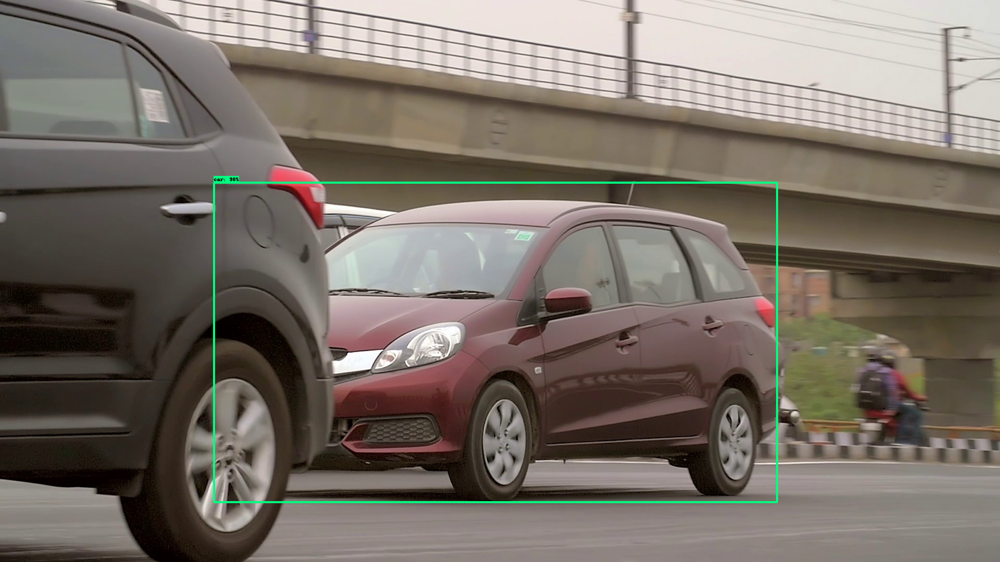

In [80]:
"""
Object Detection (On Image) From TF2 Saved Model
=====================================
"""

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf
import cv2
import argparse
from google.colab.patches import cv2_imshow

# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# PROVIDE PATH TO IMAGE DIRECTORY
IMAGE_PATHS = '/content/training_demo/images/test/image24.jpg'


# PROVIDE PATH TO MODEL DIRECTORY
PATH_TO_MODEL_DIR = '/content/training_demo/exported-models'

# PROVIDE PATH TO LABEL MAP
PATH_TO_LABELS = '/content/training_demo/annotations/label_map.pbtxt'

# PROVIDE THE MINIMUM CONFIDENCE THRESHOLD
MIN_CONF_THRESH = float(0.60)

# LOAD THE MODEL

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# LOAD SAVED MODEL AND BUILD DETECTION FUNCTION
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# LOAD LABEL MAP DATA FOR PLOTTING

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
      path: the file path to the image
    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))




print('Running inference for {}... '.format(IMAGE_PATHS), end='')

image = cv2.imread(IMAGE_PATHS)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image_rgb, axis=0)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

# input_tensor = np.expand_dims(image_np, 0)
detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
               for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_with_detections = image.copy()

# SET MIN_SCORE_THRESH BASED ON YOU MINIMUM THRESHOLD FOR DETECTIONS
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=0.5,
      agnostic_mode=False)

print('Done')
# DISPLAYS OUTPUT IMAGE
cv2_imshow(image_with_detections)
# CLOSES WINDOW ONCE KEY IS PRESSED

### **Conclusion**

Detection quite impressive since the model trained for 3600 steps.

### **End of Notebook**